# Operational Forecasting Problems

Case study via the [M5 forecasting competition dataset](https://www.kaggle.com/competitions/m5-forecasting-accuracy).

M-competitions named after Spyros Makridakis, [6th edition](https://mofc.unic.ac.cy/the-m6-competition/) ended not so long ago.

M5 data provided by Walmart.



## M5 Data Summary

* 42,840 hierarchical time series, 3049 products from 3 categories, 7 departments
* 3 US states: California (CA), Texas (TX), and Wisconsin (WI), 10 stores
* “Hierarchical” levels: item level, department level, product category level, and state level.
* Daily sales: Jan 2011 to June 2016. 
* included co-variates: prices, promotions, and holidays. 

In [1]:
# there is a performance regression in the current lightning version 
# this is under active investigation by the GluonTS core dev team
!pip install -U "gluonts[torch]==0.13.0" matplotlib orjson tensorboard optuna datasets "pytorch-lightning==1.5"

DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621


DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621


In [53]:
import pandas as pd
import matplotlib.pyplot as plt
from pprint import pprint

plt.style.use('ggplot')

from gluonts.dataset.pandas import PandasDataset
from gluonts.dataset.util import to_pandas

# Loading the M5 dataset

Attention: you need to downloaded the data from Kaggle and adapt the script 
to where the data is.

In [3]:
import os
from pathlib import Path
import pandas as pd
import numpy as np

In [4]:
# ADAPT ME
m5_files_path = Path( os.path.abspath('') ).parent / "m5-forecasting-accuracy"

In [34]:
cal = pd.read_csv(m5_files_path / "calendar.csv")

cal['event_type_1'] = cal['event_type_1'].apply(lambda x: 0 if str(x)=="nan" else 1)
cal['event_type_2'] = cal['event_type_2'].apply(lambda x: 0 if str(x)=="nan" else 1)
cal['snap_CA'] = cal['snap_CA'].apply(lambda x: 0 if str(x)=="nan" else 1)
cal['snap_TX'] = cal['snap_TX'].apply(lambda x: 0 if str(x)=="nan" else 1)
cal['snap_WI'] = cal['snap_WI'].apply(lambda x: 0 if str(x)=="nan" else 1)

weekly_prices = pd.read_csv(m5_files_path / "sell_prices.csv")

sales_and_features = pd.read_csv(
    m5_files_path / "sales_train_validation.csv",
    index_col=["id", "item_id", "dept_id", "cat_id", "store_id", "state_id"]
)

sales_and_features.sort_index(inplace=True)

In [35]:
# set prediction length to 4 weeks
prediction_length = 28

## Data exploration

Let's look at the data and some aggregate statistics. [This notebook (in R)](https://www.kaggle.com/code/headsortails/back-to-predict-the-future-interactive-m5-eda#summary-statistics) contains further (very nice) exploratory data analysis.

array([[<Axes: title={'center': 'zeros'}>]], dtype=object)

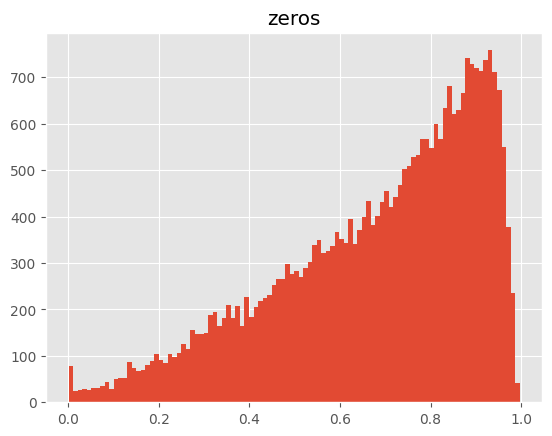

In [36]:
percentage_zeros = sales_and_features[
    sales_and_features == 0
    ].count(axis=1)/len(sales_and_features.columns)
pd.DataFrame(
    percentage_zeros,
    columns = ['zeros']).hist(bins=100)


In [37]:
sales_and_features

,,,,,,d_1,d_2,d_3,d_4,d_5,d_6,d_7,d_8,d_9,d_10,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
id,item_id,dept_id,cat_id,store_id,state_id,,,,,,,,,,,,,,,,,,,,,
FOODS_1_001_CA_1_validation,FOODS_1_001,FOODS_1,FOODS,CA_1,CA,3,0,0,1,4,2,0,2,0,0,...,0,2,0,4,1,1,0,1,1,0
FOODS_1_001_CA_2_validation,FOODS_1_001,FOODS_1,FOODS,CA_2,CA,2,0,0,0,1,0,8,0,4,1,...,1,0,14,0,1,1,4,0,0,4
FOODS_1_001_CA_3_validation,FOODS_1_001,FOODS_1,FOODS,CA_3,CA,1,2,1,1,1,2,0,1,1,1,...,0,0,13,0,0,0,0,0,1,0
FOODS_1_001_CA_4_validation,FOODS_1_001,FOODS_1,FOODS,CA_4,CA,0,1,1,1,1,1,0,0,0,0,...,0,0,0,2,0,0,0,1,1,1
FOODS_1_001_TX_1_validation,FOODS_1_001,FOODS_1,FOODS,TX_1,TX,0,1,1,0,0,0,0,0,2,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HOUSEHOLD_2_516_TX_2_validation,HOUSEHOLD_2_516,HOUSEHOLD_2,HOUSEHOLD,TX_2,TX,0,1,0,0,0,0,1,1,0,0,...,0,1,1,0,0,1,0,0,0,0
HOUSEHOLD_2_516_TX_3_validation,HOUSEHOLD_2_516,HOUSEHOLD_2,HOUSEHOLD,TX_3,TX,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
HOUSEHOLD_2_516_WI_1_validation,HOUSEHOLD_2_516,HOUSEHOLD_2,HOUSEHOLD,WI_1,WI,0,0,0,1,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0


<Axes: ylabel='Frequency'>

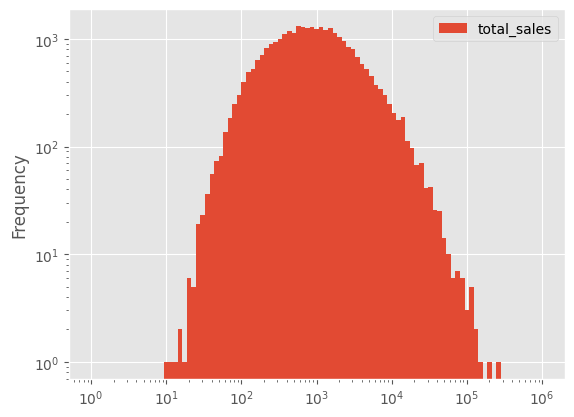

In [38]:
total_sales_by_item = sales_and_features.sum(axis=1)
pd.DataFrame(
    total_sales_by_item,
    columns = ['total_sales']).plot(kind="hist", logy=True, logx=True, bins=np.logspace(0, 6, 100))

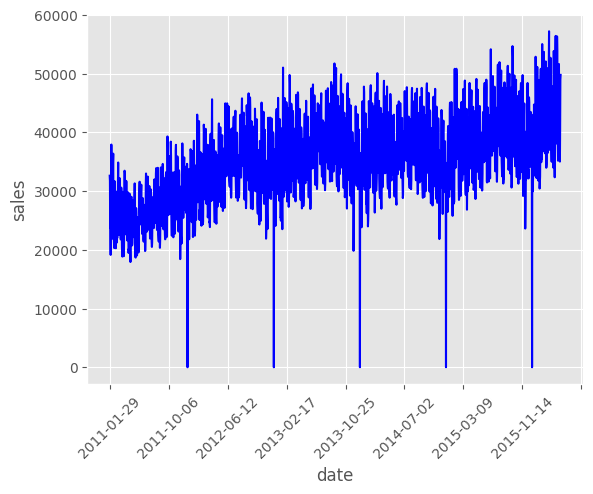

In [11]:
total_sales = pd.DataFrame(
    sales_and_features.sum(axis=0)
    ).rename( columns={0 :'sales'})
total_sales['time'] = cal.date.values[:1913]
total_sales = total_sales.set_index(['time'])
total_sales['sales'].plot(rot=45,color='blue')
plt.xlabel("date")
plt.ylabel("sales")
plt.show()

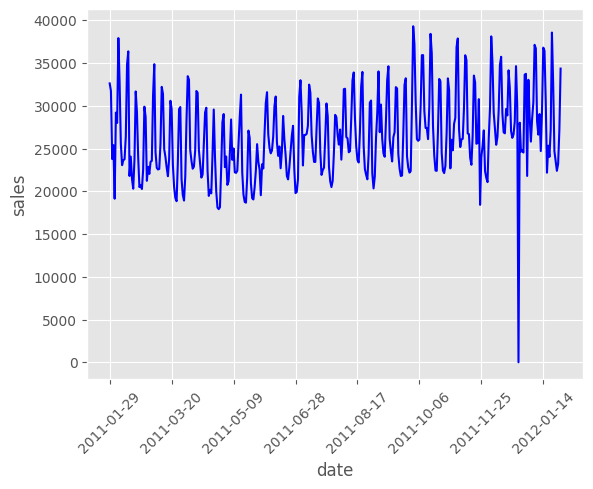

In [443]:
# zooming in
total_sales['sales'].iloc[0:365].plot(rot=45, color='blue')
plt.xlabel("date")
plt.ylabel("sales")
plt.show()

In [ ]:
# Sales (blue) vs price changes (orange) vs events (black)
fig, ax = plt.subplots(2, 1, figsize=(7, 4))
ax2 = ax[0].twinx()
ax3 = ax[1].twinx()

ax[0].plot(ex['target'].loc['2012'], color='blue')
ax2.plot(ex['price'].loc['2012'], color='orange')

ax[1].plot(ex['event'].loc['2012'], color='black')

plt.grid(which="both")
plt.show()

## Further data preparation

* We look at a subset, FOOD_3, to make things a bit faster
* We add further features like additional holidays (there's a Christmas dip!)
* We create a training and a test set

In [13]:
# we only look at FOODS_3 to make the data set a bit smaller for demo purposes
sales_and_features = sales_and_features[
    sales_and_features.index.get_level_values(
        'dept_id') =='FOODS_3'
    ]
sales_and_features = sales_and_features[
    sales_and_features.index.get_level_values(
        'dept_id') =='FOODS_3'
    ]

In [17]:
sales_and_features

,,,,,,d_1,d_2,d_3,d_4,d_5,d_6,d_7,d_8,d_9,d_10,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
id,item_id,dept_id,cat_id,store_id,state_id,,,,,,,,,,,,,,,,,,,,,
FOODS_3_001_CA_1_validation,FOODS_3_001,FOODS_3,FOODS,CA_1,CA,1,1,1,1,1,0,1,2,1,1,...,0,0,1,2,0,0,1,0,0,1
FOODS_3_001_CA_2_validation,FOODS_3_001,FOODS_3,FOODS,CA_2,CA,0,0,0,0,0,1,0,2,0,0,...,0,0,1,0,0,1,0,2,1,0
FOODS_3_001_CA_3_validation,FOODS_3_001,FOODS_3,FOODS,CA_3,CA,4,1,1,0,1,2,2,2,4,0,...,2,0,6,2,0,3,4,0,0,2
FOODS_3_001_CA_4_validation,FOODS_3_001,FOODS_3,FOODS,CA_4,CA,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,2,1,0,0,0
FOODS_3_001_TX_1_validation,FOODS_3_001,FOODS_3,FOODS,TX_1,TX,0,2,1,2,0,0,0,5,3,3,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
FOODS_3_827_TX_2_validation,FOODS_3_827,FOODS_3,FOODS,TX_2,TX,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,12,0,0,0,0
FOODS_3_827_TX_3_validation,FOODS_3_827,FOODS_3,FOODS,TX_3,TX,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,0,3
FOODS_3_827_WI_1_validation,FOODS_3_827,FOODS_3,FOODS,WI_1,WI,0,0,0,0,0,0,0,0,0,0,...,4,7,3,1,8,3,1,2,0,0


In [25]:
sales_and_features = sales_and_features.reset_index()

We want to split the data into static (categorical features) vs dynamic (sales data). We keep the 'id' column in both, to be able to join the two. We also keep 'item_id' and 'store_id' in the sales data, to be able to join with prices later.

In [26]:
features_columns = ["id", "item_id", "dept_id", "cat_id", "store_id", "state_id"]
sales_columns = ["id", "item_id", "store_id"] + [f"d_{k}" for k in range(1, 1914)]

In [28]:
# Split data into static (categorical features) vs dynamic (sales data).
features = sales_and_features[features_columns].set_index("id").astype("category")
sales = sales_and_features[sales_columns]

In [29]:
# turn data into long format to join more easily with prices
sales_long = sales.melt(id_vars=["id", "item_id", "store_id"], var_name="d", value_name="sales")

To join sales data with prices, first we add the `"wm_yr_wk"` column from `cal`. We also add the `"date"` column to build the time index. Then we join with `weekly_prices` on `"store_id"`, `"item_id"`, `"wm_yr_wk"`, to get the `"sell_price"` column in. We also add all holidays that are contained in the calendar.

In [41]:
# holidays are contained in the calendar of the data set
# event_name_1 is a categorical column, which we turn into
# 0/1 columns using standard pandas
# (we disregard _event_2)
dummy_df = pd.get_dummies(cal['event_name_1'])

cal = pd.concat([cal, dummy_df], axis=1)

holidays = list(cal.columns[14:])
holidays 

['Chanukah End',
 'Christmas',
 'Cinco De Mayo',
 'ColumbusDay',
 'Easter',
 'Eid al-Fitr',
 'EidAlAdha',
 "Father's day",
 'Halloween',
 'IndependenceDay',
 'LaborDay',
 'LentStart',
 'LentWeek2',
 'MartinLutherKingDay',
 'MemorialDay',
 "Mother's day",
 'NBAFinalsEnd',
 'NBAFinalsStart',
 'NewYear',
 'OrthodoxChristmas',
 'OrthodoxEaster',
 'Pesach End',
 'PresidentsDay',
 'Purim End',
 'Ramadan starts',
 'StPatricksDay',
 'SuperBowl',
 'Thanksgiving',
 'ValentinesDay',
 'VeteransDay']

In [42]:
# add holidays 
temp = sales_long.merge(
    cal[list([
        "d", "wm_yr_wk", "date",
        'event_type_1','event_type_2', 
        'snap_CA', 'snap_TX', 'snap_WI' ]) + list(cal.columns[14:])
    ], on="d", how="left", suffixes=(None, "_right")
)

In [43]:
# add prices
sales_with_prices = temp.merge(
    weekly_prices, on=["store_id", "item_id", "wm_yr_wk"], 
    how="left", suffixes=(None, "_right")
)

In [44]:
sales_with_prices.index = pd.to_datetime(sales_with_prices["date"])

Some rows have missing price, which means the item was not for sale. Let's replace price there with some constant, and add a column indicating whether the product was for sale.

In [45]:
sales_with_prices["for_sale"] = sales_with_prices["sell_price"].notna()
sales_with_prices["sell_price"].fillna(0.0, inplace=True)

In [462]:
# plot a time series of a fast items & price changes
tmp = sales_with_prices.groupby('id').agg({'sell_price': pd.Series.nunique, 'sales': np.sum})
fast_movers = tmp[(tmp['sell_price'] > 3) & (tmp['sales'] > 100) ].index
fast_movers

/var/folders/wf/6gh5723s0lg0c41lqgm8y8xm0000gn/T/ipykernel_47970/2749863843.py:2: FutureWarning: The provided callable <function sum at 0x10d6148b0> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  tmp = sales_with_prices.groupby('id').agg({'sell_price': pd.Series.nunique, 'sales': np.sum})


Index(['FOODS_3_176_WI_1_validation', 'FOODS_3_224_TX_3_validation',
       'FOODS_3_822_TX_1_validation', 'FOODS_3_822_TX_2_validation'],
      dtype='object', name='id')

<Axes: xlabel='date'>

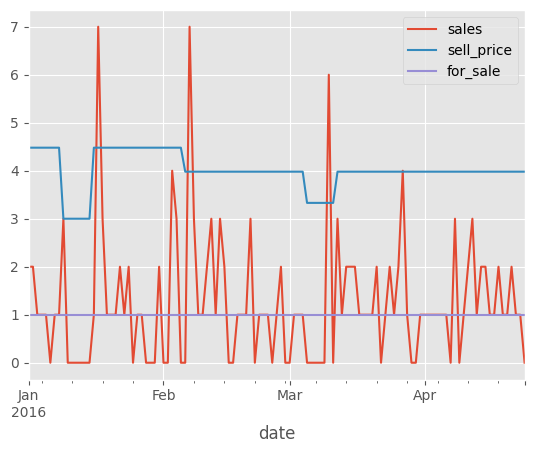

In [464]:
sales_with_prices[['sales', 'sell_price', 'for_sale']][sales_with_prices['id'] == fast_movers[1]].plot()

We need to keep our target and feature columns as float32, to be compatible with the model later.

In [46]:
sales_with_prices["sales"] = sales_with_prices["sales"].astype(np.float32)
sales_with_prices["sell_price"] = sales_with_prices["sell_price"].astype(np.float32)
sales_with_prices["for_sale"] = sales_with_prices["for_sale"].astype(np.float32)

In [389]:
# just pick 2016
sales_with_prices_full = sales_with_prices
sales_with_prices = sales_with_prices.loc['2016']

We're ready to construct our dataset object.

In [390]:
from gluonts.dataset.pandas import PandasDataset

dataset = PandasDataset.from_long_dataframe(
    sales_with_prices,
    item_id='id',
    target='sales',
    feat_dynamic_real=list([
        'sell_price', 'for_sale',
        'event_type_1','event_type_2', 
        'snap_CA', 'snap_TX', 'snap_WI' 
    ]) + holidays,
    static_features=features,
)

In [391]:
len(dataset)

8230

In [392]:
# let's look at an entry of the dataset
for entry in dataset:
    pprint(entry)
    break

{'feat_dynamic_real': array([[2.5, 2.5, 2.5, ..., 2.5, 2.5, 2.5],
       [1.0, 1.0, 1.0, ..., 1.0, 1.0, 1.0],
       [1, 0, 0, ..., 0, 0, 0],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]], dtype=object),
 'feat_static_cat': array([0., 0., 0., 0., 0.], dtype=float32),
 'item_id': 'FOODS_3_001_CA_1_validation',
 'start': Period('2016-01-01', 'D'),
 'target': array([0., 1., 1., 1., 0., 2., 0., 0., 2., 0., 2., 0., 0., 0., 0., 2., 0.,
       2., 1., 0., 2., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 2., 1.,
       0., 2., 0., 0., 2., 0., 2., 1., 0., 0., 1., 0., 0., 0., 0., 2., 0.,
       1., 2., 0., 0., 1., 1., 1., 0., 0., 1., 1., 0., 0., 1., 1., 1., 0.,
       1., 0., 0., 0., 0., 1., 1., 0., 0., 0., 2., 1., 0., 0., 1., 1., 1.,
       3., 1., 0., 0., 0., 1., 0., 0., 1., 0., 1., 0., 0., 2., 0., 3., 1.,
       0., 0., 0., 0., 0., 1., 2., 0., 0., 1., 0., 0., 1.

Let's store some metadata and turn the dataset into a list: this will be faster to iterate compared to `PandasDataset` (good for model training and evaluation).

In [393]:
num_feat_dynamic_real = dataset.num_feat_dynamic_real
static_cardinalities = dataset.static_cardinalities.tolist()

In [394]:
num_feat_dynamic_real

37

In [395]:
static_cardinalities

[823.0, 1.0, 1.0, 10.0, 3.0]

In [396]:
dataset = list(dataset)

### Split data for training and evaluation

In [398]:
from gluonts.dataset.split import split

training_dataset, test_gen = split(dataset, offset=-prediction_length)

In [399]:
test_data = test_gen.generate_instances(prediction_length=prediction_length, windows=1)

In [400]:
len(test_data)

8230

# Baseline: NPTS

* NPTS = Non-parametric time series forecaster
* references: 
    * [page 11 from GluonTS JMLR paper](https://arxiv.org/pdf/1906.05264.pdf) 
    * [paper](https://arxiv.org/html/2312.14657v1) with extension to deep learning
* A generalization of the climatological forecaster:
    * climatological forecaster samples every past value with equal probability
    * NPTS allows to adjust this uniform distribution, e.g., using an exponential decay => values in the near past are exponentially more likely to be sampled
    * kernel function can be made seasonal

In [77]:
from gluonts.model.npts import NPTSPredictor

npts = NPTSPredictor(freq="1D", prediction_length=prediction_length)

A useful tool in GluonTS is the ``make_evaluation_predictions`` short cut that helps to get forecasts on the last available part of the data set provided. There are other useful tools around [data splitting](https://ts.gluon.ai/stable/tutorials/data_manipulation/dataset_splitting_example.html).

In [82]:
from tqdm.autonotebook import tqdm
from gluonts.evaluation.backtest import make_evaluation_predictions

# a GluonTS short-hand to make forecasts in a backtest scenario
forecast_npts_it, ts_it = make_evaluation_predictions(
    dataset=dataset,
    predictor=npts,
    num_samples=100
)
# this can take a while to run
tss = list(tqdm(ts_it, total=len(dataset)))
forecasts_npts = list(tqdm(forecast_npts_it, total=len(dataset)))

  0%|          | 0/8230 [00:00<?, ?it/s]

  0%|          | 0/8230 [00:00<?, ?it/s]

## Let's look at some sparse/intermittent time series

* A sparse or intermittent time series is one with lots of 0s.
* Many forecasting methods struggle with these
* NPTS doesn't -- by design!
* in use at Amazon retail since 2016



In [89]:
def plot_prob_forecasts(ts_ent, forecast_ent):
    plot_length = 150
    prediction_intervals = (0.5, 0.9)
    legend = ["observations", "median prediction"] + [
        f"{k}% prediction interval" for k in prediction_intervals
    ][::-1]

    fig, ax = plt.subplots(1, 1, figsize=(10, 7))
    ts_ent[-plot_length:].plot(ax=ax, color='blue')  # plot the time series
    forecast_ent.plot(intervals=prediction_intervals, color='green')
    plt.grid(which="both")
    plt.legend(legend, loc="upper left")
    plt.show()

In [90]:
ct = 0
to_plot = []
for idx in range(0, len(tss)):
    if (float(tss[idx].sum()) <= 1000.0):
        to_plot.append( [tss[idx], forecasts_npts[idx]] )
        ct += 1
    if ct > 10:
        break

/var/folders/wf/6gh5723s0lg0c41lqgm8y8xm0000gn/T/ipykernel_47970/663363055.py:4: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  if (float(tss[idx].sum()) <= 1000.0):


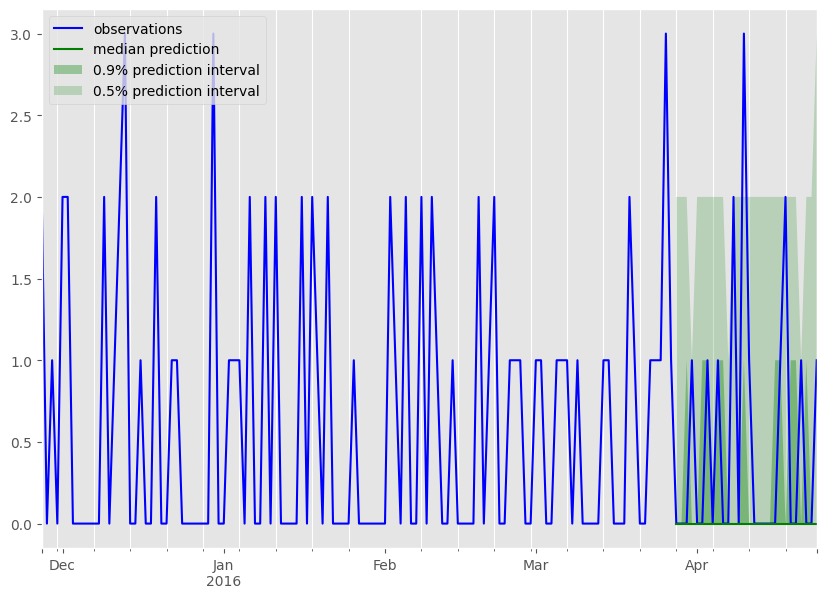

In [91]:
plt_idx = 0
plot_prob_forecasts(to_plot[plt_idx][0], to_plot[plt_idx][1])

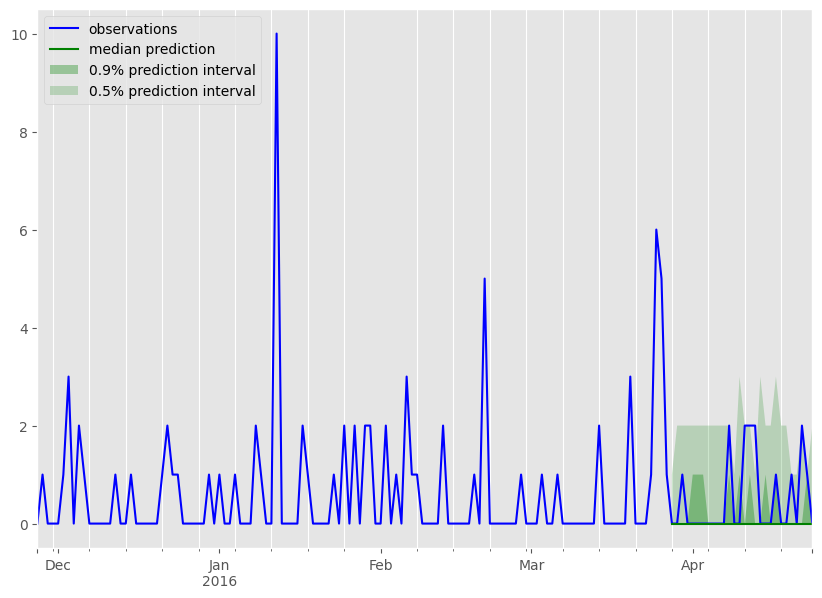

In [92]:
plt_idx = 1
plot_prob_forecasts(to_plot[plt_idx][0], to_plot[plt_idx][1])

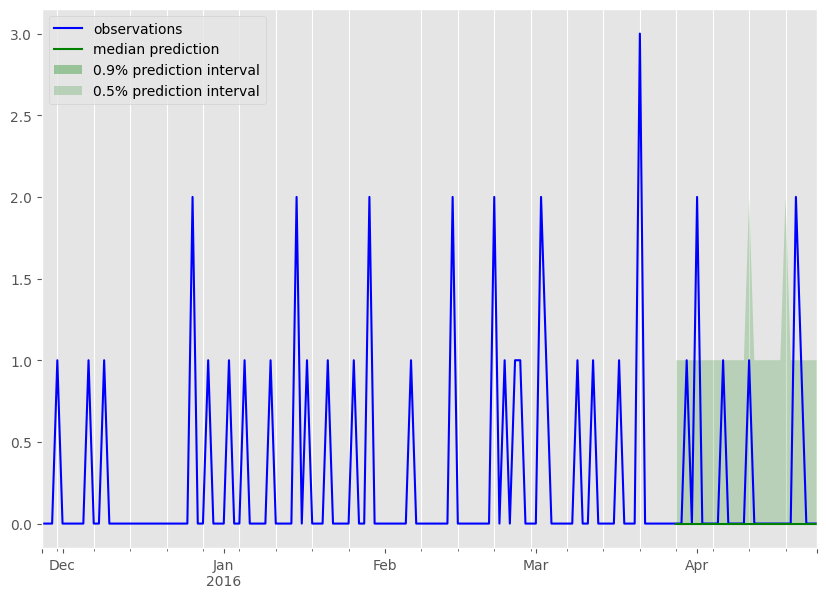

In [93]:
plt_idx = 2
plot_prob_forecasts(to_plot[plt_idx][0], to_plot[plt_idx][1])

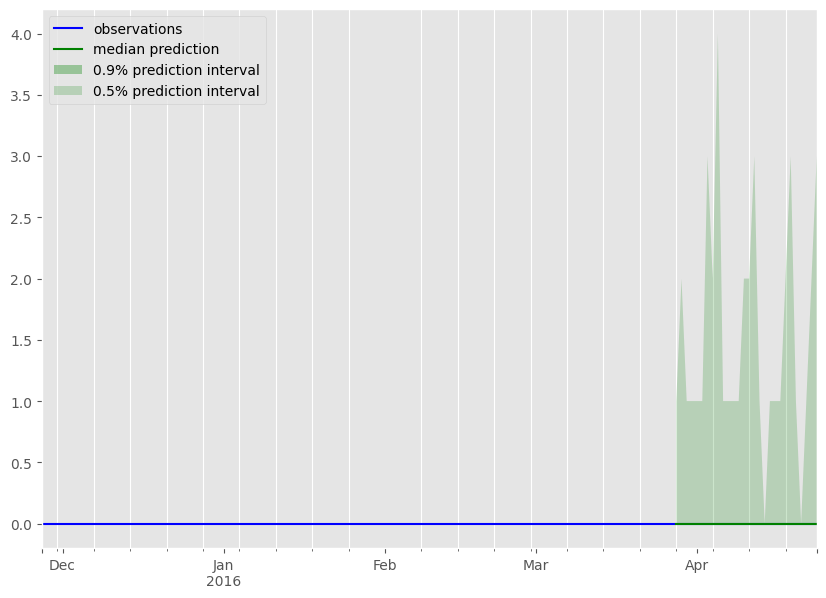

In [94]:
plt_idx = 3
plot_prob_forecasts(to_plot[plt_idx][0], to_plot[plt_idx][1])

## Plot aggregate demand vs aggregated forecast

A helpful qualitative diagnostic instrument is plotting the aggregated actuals versus the aggregated forecasts. We probabilistic forecasts in a sample path representation, we can easily produce aggregated probabilistic forecasts - we just sum the sample paths. 

## Quiz
Do you think that NPTS is able to meaningfully learn global patterns? 

In [95]:
# helper function to plot the aggregated values against aggregated forecasts
from gluonts.model.forecast import SampleForecast
# importing functools for reduce()
import functools

def sum_forecasts(left: SampleForecast, right: SampleForecast):
    return  SampleForecast(left.samples + right.samples,
        left.start_date,
        left.item_id,
        left.info
    )

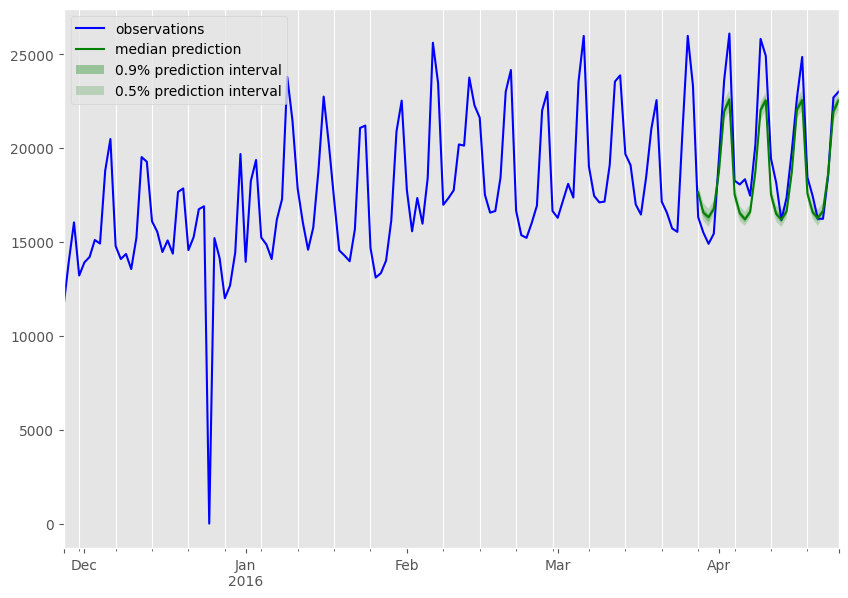

In [96]:
agg_actuals = sum(tss)
agg_prob_forecasts = functools.reduce(lambda a, b: sum_forecasts(a, b), forecasts_npts)

# plot the aggregated sales against the aggregated forecast
plot_prob_forecasts(agg_actuals, agg_prob_forecasts)

In [97]:
# calculate metrics for NPTS
from gluonts.evaluation import Evaluator

evaluator = Evaluator(quantiles=[0.1, 0.5, 0.9])
# gives me metrics both across time series and for individual time series
agg_metrics_npts, item_metrics_npts = evaluator(tss, forecasts_npts)

Running evaluation: 8230it [00:00, 32754.26it/s]
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-package

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/g

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-package

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/g

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in double_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/g

In [98]:
import json
print(json.dumps(agg_metrics_npts, indent=4))

{
    "MSE": 11.168627346380838,
    "abs_error": 354003.0,
    "abs_target_sum": 545454.0,
    "abs_target_mean": 2.367010935601458,
    "seasonal_error": 1.3929023715731115,
    "MASE": 1.5634337664013869,
    "MAPE": 0.7351001176263061,
    "sMAPE": 1.381406359985222,
    "MSIS": 15.822756266119326,
    "QuantileLoss[0.1]": 115652.2,
    "Coverage[0.1]": 0.4655485158826593,
    "QuantileLoss[0.5]": 354003.0,
    "Coverage[0.5]": 0.6266446797431002,
    "QuantileLoss[0.9]": 234219.8,
    "Coverage[0.9]": 0.8947187988196493,
    "RMSE": 3.34194963253201,
    "NRMSE": 1.4118860129739197,
    "ND": 0.6490061490061491,
    "wQuantileLoss[0.1]": 0.2120292453625787,
    "wQuantileLoss[0.5]": 0.6490061490061491,
    "wQuantileLoss[0.9]": 0.4294033960700627,
    "mean_absolute_QuantileLoss": 234625.0,
    "mean_wQuantileLoss": 0.4301462634795968,
    "MAE_Coverage": 0.3982395996065498,
    "OWA": NaN
}


In [124]:
item_metrics_npts.head()

,item_id,forecast_start,MSE,abs_error,abs_target_sum,abs_target_mean,seasonal_error,MASE,MAPE,sMAPE,ND,MSIS,QuantileLoss[0.1],Coverage[0.1],QuantileLoss[0.5],Coverage[0.5],QuantileLoss[0.9],Coverage[0.9]
0,FOODS_3_001_CA_1_validation,2016-03-28,0.599289,14.0,14.0,0.500000,0.621019,0.805128,1.000000,2.000000,1.00,4.313187,2.8,0.642857,14.0,0.642857,11.4,0.892857
1,FOODS_3_001_CA_2_validation,2016-03-28,0.654075,14.0,14.0,0.500000,0.667197,0.749403,1.000000,2.000000,1.00,6.262871,2.8,0.678571,14.0,0.678571,12.4,0.857143
2,FOODS_3_001_CA_3_validation,2016-03-28,6.120600,57.0,60.0,2.142857,1.225584,1.661016,0.774074,1.577381,0.95,12.967580,12.0,0.357143,57.0,0.428571,46.6,0.714286
3,FOODS_3_001_CA_4_validation,2016-03-28,0.361457,8.0,8.0,0.285714,0.265393,1.076571,1.000000,2.000000,1.00,11.842286,1.6,0.785714,8.0,0.785714,9.4,0.892857
4,FOODS_3_001_TX_1_validation,2016-03-28,0.080200,0.0,0.0,0.000000,0.659236,0.000000,NaN,NaN,NaN,3.900621,0.0,1.000000,0.0,1.000000,3.8,1.000000


In [129]:
# group metrics by velocity buckets
bins = np.linspace(0, item_metrics_npts['abs_target_sum'].max(),5)
velocity_groups = item_metrics_npts.iloc[:,2:].groupby(
    [pd.cut(item_metrics_npts.abs_target_sum, bins)]
    ).mean()
velocity_groups

/var/folders/wf/6gh5723s0lg0c41lqgm8y8xm0000gn/T/ipykernel_47970/646341159.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  velocity_groups = item_metrics_npts.iloc[:,2:].groupby(


,MSE,abs_error,abs_target_sum,abs_target_mean,seasonal_error,MASE,MAPE,sMAPE,ND,MSIS,QuantileLoss[0.1],Coverage[0.1],QuantileLoss[0.5],Coverage[0.5],QuantileLoss[0.9],Coverage[0.9]
abs_target_sum,,,,,,,,,,,,,,,,
"(0.0, 772.5]",8.982426,41.774284,60.537619,2.162058,1.331995,1.606590,0.737465,1.377015,1.061948,16.107885,13.334895,0.447013,41.774284,0.613199,27.362317,0.890966
"(772.5, 1545.0]",304.668562,343.115385,1031.192308,36.828297,10.199381,1.459170,0.453815,0.392990,0.335961,14.796260,164.111538,0.086538,343.115385,0.407280,202.023077,0.817308
"(1545.0, 2317.5]",437.600787,399.714286,1888.428571,67.443878,19.509402,0.749588,0.254970,0.216227,0.210131,6.176524,259.742857,0.091837,399.714286,0.586735,207.000000,0.954082
"(2317.5, 3090.0]",706.709582,487.000000,3090.000000,110.357143,40.849257,0.425781,0.146289,0.162805,0.157605,5.410135,263.000000,0.035714,487.000000,0.321429,322.600000,0.821429


-> Go back to slides

# DeepAR

[DeepAR](https://www.sciencedirect.com/science/article/pii/S0169207019301888) is an RNN-based, probabilistic forecasting method.


In [341]:
from gluonts.torch.model.deepar import DeepAREstimator



estimator_deepar_def = DeepAREstimator(
    prediction_length=prediction_length,
    freq="1D",
    # lags are determined automatically based on frequency
    #     lags_seq = [1], 
    # scaling is automatically enabled, but can we switched off
    # scaling = False, 
    trainer_kwargs={
        "enable_progress_bar": True,
        "enable_model_summary": True,
        "max_epochs": 200,
        "accelerator": "cpu"
    },
    num_feat_dynamic_real=num_feat_dynamic_real, 
    num_feat_static_cat=len(static_cardinalities),
    cardinality = static_cardinalities,
)


In [342]:
predictor_deepar_def = estimator_deepar_def.train(training_dataset)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
/usr/local/lib/python3.9/site-packages/pytorch_lightning/trainer/configuration_validator.py:118: UserWarning: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
  rank_zero_warn("You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.")

  | Name  | Type        | Params | In sizes | Out sizes   
----------------------------------------------------------------
0 | model | DeepARModel | 82.3 K | ?        | [1, 100, 28]
----------------------------------------------------------------
82.3 K    Trainable params
0         Non-trainable params
82.3 K    Total params
0.329     Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

Epoch 0, global step 49: train_loss reached -5.81520 (best -5.81520), saving model to "/Users/tim/Projects/maven/lightning_logs/version_116/checkpoints/epoch=0-step=49.ckpt" as top 1
Epoch 1, global step 99: train_loss was not in top 1
Epoch 2, global step 149: train_loss was not in top 1
Epoch 3, global step 199: train_loss reached -7.55600 (best -7.55600), saving model to "/Users/tim/Projects/maven/lightning_logs/version_116/checkpoints/epoch=3-step=199.ckpt" as top 1
Epoch 4, global step 249: train_loss was not in top 1
Epoch 5, global step 299: train_loss was not in top 1
Epoch 6, global step 349: train_loss was not in top 1
Epoch 7, global step 399: train_loss was not in top 1
Epoch 8, global step 449: train_loss was not in top 1
Epoch 9, global step 499: train_loss was not in top 1
Epoch 10, global step 549: train_loss was not in top 1
Epoch 11, global step 599: train_loss was not in top 1
Epoch 12, global step 649: train_loss was not in top 1
Epoch 13, global step 699: train_los

Epoch 130, global step 6549: train_loss was not in top 1
Epoch 131, global step 6599: train_loss was not in top 1
Epoch 132, global step 6649: train_loss was not in top 1
Epoch 133, global step 6699: train_loss was not in top 1
Epoch 134, global step 6749: train_loss was not in top 1
Epoch 135, global step 6799: train_loss was not in top 1
Epoch 136, global step 6849: train_loss was not in top 1
Epoch 137, global step 6899: train_loss reached -8.82815 (best -8.82815), saving model to "/Users/tim/Projects/maven/lightning_logs/version_116/checkpoints/epoch=137-step=6899.ckpt" as top 1
Epoch 138, global step 6949: train_loss was not in top 1
Epoch 139, global step 6999: train_loss was not in top 1
Epoch 140, global step 7049: train_loss was not in top 1
Epoch 141, global step 7099: train_loss was not in top 1
Epoch 142, global step 7149: train_loss was not in top 1
Epoch 143, global step 7199: train_loss was not in top 1
Epoch 144, global step 7249: train_loss was not in top 1
Epoch 145, 

In [343]:
forecast_it, ts_it = make_evaluation_predictions(
    dataset=test_data.input,
    predictor=predictor_deepar_def,
    num_samples=100
)

print("Obtaining time series conditioning values ...")
tss = list(tqdm(ts_it, total=len(test_data.input)))
print("Obtaining time series predictions ...")
forecasts_deepar_def = list(tqdm(forecast_it, total=len(test_data.input)))

Obtaining time series conditioning values ...


  0%|          | 0/8230 [00:00<?, ?it/s]

Obtaining time series predictions ...


  0%|          | 0/8230 [00:00<?, ?it/s]

In [344]:
evaluator = Evaluator(quantiles=[0.1, 0.5, 0.9])
# gives me metrics both across time series and for individual time series
agg_metrics_deepar_def, item_metrics_deepar_def = evaluator(tss, forecasts_deepar_def)

Running evaluation: 8230it [00:01, 5295.73it/s]
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) 

  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["a

  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["a

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/g

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/g

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/g

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/g

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/pandas/core/dtypes/astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)


In [345]:
print(json.dumps(agg_metrics_deepar_def, indent=4))


{
    "MSE": 11.805017217148363,
    "abs_error": 341167.82573218644,
    "abs_target_sum": 541800.0,
    "abs_target_mean": 2.3511543134872417,
    "seasonal_error": 1.3888717947375038,
    "MASE": 1.5660623757062315,
    "MAPE": 0.8066584612193729,
    "sMAPE": 1.5403056696789317,
    "MSIS": 33.06622474854815,
    "QuantileLoss[0.1]": 115906.20553342826,
    "Coverage[0.1]": 0.02156743620899149,
    "QuantileLoss[0.5]": 341167.8255523643,
    "Coverage[0.5]": 0.4055936469362958,
    "QuantileLoss[0.9]": 288425.1855640313,
    "Coverage[0.9]": 0.7361352195799341,
    "RMSE": 3.4358430140430403,
    "NRMSE": 1.4613430493836808,
    "ND": 0.6296932922336406,
    "wQuantileLoss[0.1]": 0.21392802793176127,
    "wQuantileLoss[0.5]": 0.6296932919017428,
    "wQuantileLoss[0.9]": 0.5323462265855137,
    "mean_absolute_QuantileLoss": 248499.7388832746,
    "mean_wQuantileLoss": 0.45865584880633925,
    "MAE_Coverage": 0.3453784065266447,
    "OWA": NaN
}


In [346]:
item_metrics_deepar_def.head()


,item_id,forecast_start,MSE,abs_error,abs_target_sum,abs_target_mean,seasonal_error,MASE,MAPE,sMAPE,ND,MSIS,QuantileLoss[0.1],Coverage[0.1],QuantileLoss[0.5],Coverage[0.5],QuantileLoss[0.9],Coverage[0.9]
0,FOODS_3_001_CA_1_validation,2016-02-29,8.213696e-01,1.785908e+01,18.0,0.642857,0.621228,1.026715e+00,0.923234,1.869192,0.992171,2.104579e+01,4.651294e+00,0.000000,1.785908e+01,0.464286,2.190217e+01,0.642857
1,FOODS_3_001_CA_2_validation,2016-02-29,2.785680e+00,2.000783e+01,20.0,0.714286,0.663254,1.077363e+00,1.000072,1.999928,1.000392,4.305118e+01,4.006088e+00,0.000000,2.000783e+01,0.464286,3.599139e+01,0.714286
2,FOODS_3_001_CA_3_validation,2016-02-29,4.300812e+00,4.413868e+01,45.0,1.607143,1.224138,1.287748e+00,0.960902,1.896539,0.980859,2.177333e+01,1.037943e+01,0.000000,4.413867e+01,0.250000,5.919210e+01,0.285714
3,FOODS_3_001_CA_4_validation,2016-02-29,6.066621e-01,9.001947e+00,9.0,0.321429,0.260776,1.232852e+00,0.999361,1.999447,1.000216,4.921532e+01,1.803141e+00,0.035714,9.001947e+00,0.607143,1.618473e+01,0.750000
4,FOODS_3_001_TX_1_validation,2016-02-29,1.833973e-26,3.313819e-12,0.0,0.000000,0.669181,1.768590e-13,NaN,2.000000,inf,1.039492e-12,1.254865e-12,0.142857,3.313819e-12,0.464286,1.606750e-12,0.785714


In [347]:
bins = np.linspace(0, item_metrics_deepar_def['abs_target_sum'].max(),5)
velocity_groups = item_metrics_deepar_def.iloc[:,2:].groupby(
    [pd.cut(item_metrics_deepar_def.abs_target_sum, bins)]
    ).mean()
velocity_groups

/var/folders/wf/6gh5723s0lg0c41lqgm8y8xm0000gn/T/ipykernel_47970/2126909735.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  velocity_groups = item_metrics_deepar_def.iloc[:,2:].groupby(


,MSE,abs_error,abs_target_sum,abs_target_mean,seasonal_error,MASE,MAPE,sMAPE,ND,MSIS,QuantileLoss[0.1],Coverage[0.1],QuantileLoss[0.5],Coverage[0.5],QuantileLoss[0.9],Coverage[0.9]
abs_target_sum,,,,,,,,,,,,,,,,
"(0.0, 779.5]",9.199974,41.518280,61.880788,2.210028,1.340180,1.663405,0.809284,1.518096,0.926979,35.124594,13.673980,0.017016,41.518280,0.396798,35.465079,0.723104
"(779.5, 1559.0]",397.641017,372.952556,1029.478261,36.767081,9.839112,2.316926,0.491461,0.450170,0.369746,53.549626,174.516825,0.019410,372.952560,0.344720,291.511302,0.815994
"(1559.0, 2338.5]",677.394924,504.963997,1803.750000,64.419643,17.991716,1.164428,0.253253,0.287533,0.277984,10.783223,272.748414,0.008929,504.963996,0.361607,255.945109,0.892857
"(2338.5, 3118.0]",1443.396136,673.918320,2787.000000,99.535714,31.495151,0.747864,0.203644,0.232355,0.234609,8.270930,401.768645,0.000000,673.918289,0.285714,400.018452,0.892857


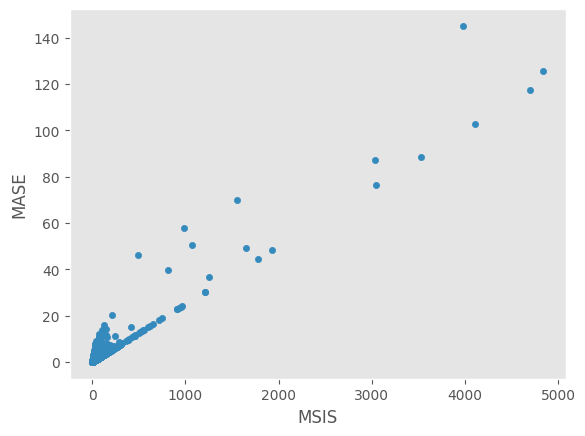

In [348]:
item_metrics_deepar_def.plot(x="MSIS", y="MASE", kind="scatter")
plt.grid(which="both")
plt.show()

array([[<Axes: title={'center': 'QuantileLoss[0.5]'}>]], dtype=object)

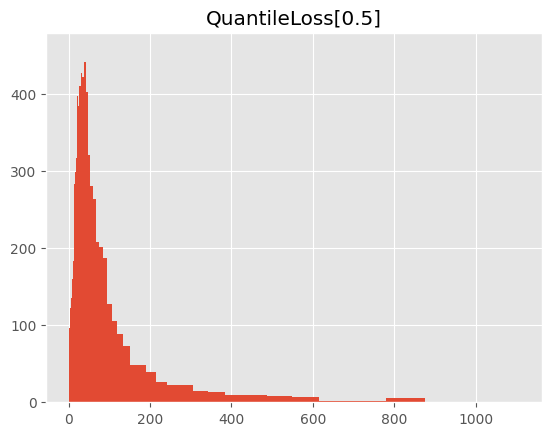

In [349]:
# obtain histogram of errors
metric='QuantileLoss[0.5]'
bins=np.append(
    [0], np.logspace(np.log10(0.01), np.log10(item_metrics_deepar_def[metric].max()), 100)
    )
item_metrics_deepar_def.hist(column=metric, bins=bins)

In [350]:
# still plot the forecastsnum_feat_dynamic_real
# first entry of the time series list
ts_entry = tss[0]

In [351]:
# first entry of test_ds
test_ds_entry = next(iter(test_data))# or test_data or test_data.input

In [352]:
# first entry of the forecast list
forecast_entry = forecasts_deepar_def[0]

In [353]:
print(f"Number of sample paths: {forecast_entry.num_samples}")
print(f"Dimension of samples: {forecast_entry.samples.shape}")
print(f"Start date of the forecast window: {forecast_entry.start_date}")
print(f"Frequency of the time series: {forecast_entry.freq}")

Number of sample paths: 100
Dimension of samples: (100, 28)
Start date of the forecast window: 2016-02-29
Frequency of the time series: <Day>


In [354]:
print(f"Mean of the future window:\n {forecast_entry.mean}")
print(f"0.5-quantile (median) of the future window:\n {forecast_entry.quantile(0.5)}"
     )

Mean of the future window:
 [ 0.28430757  0.46413985  0.34111264  0.344604    0.36469182  0.19440526
  0.17745897  0.32832095  0.19142324  0.3670036   0.12362471  0.18241026
  0.16184573  0.03949007  0.01827942  0.07727011  0.26721108  0.04540486
 -0.00693192  0.02687782  0.04452912  0.01915663  0.01438841  0.01410214
 -0.03476433  0.01075491  0.00858102  0.00562167]
0.5-quantile (median) of the future window:
 [ 3.78679752e-01  4.10212398e-01  3.02331328e-01  3.64793330e-01
  2.56123602e-01  1.28931269e-01  1.17240235e-01  1.41451612e-01
  4.26907412e-04  4.90730815e-02  3.87654756e-03  3.33366776e-03
  8.72765610e-04  9.94905480e-04  6.37852470e-04  4.14177455e-04
  3.19501472e-04  7.85787706e-05  5.03002375e-04  2.90578464e-04
  9.55755415e-04  4.50311345e-04  1.80731935e-04  4.95211512e-04
  3.10232645e-05 -4.90512641e-04 -1.23361562e-04  1.03804363e-04]


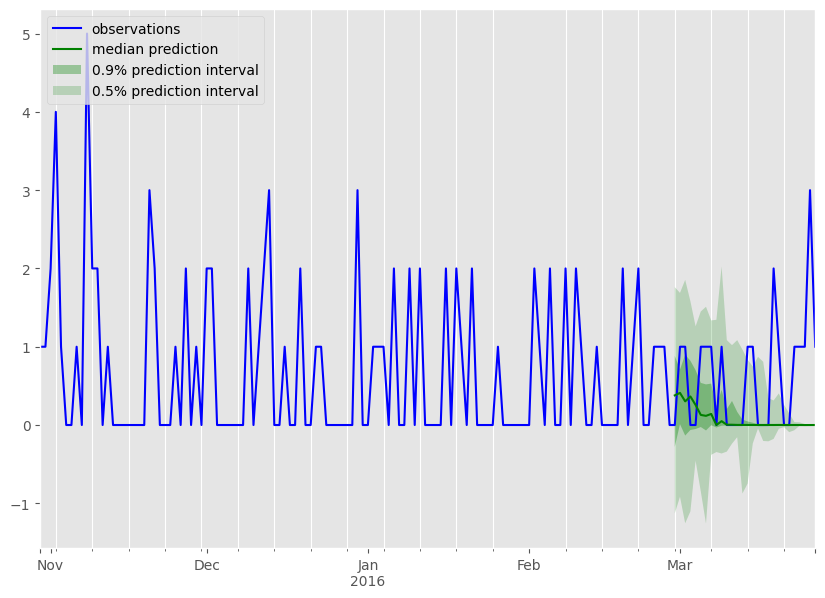

In [355]:
plot_prob_forecasts(tss[0], forecast_entry)

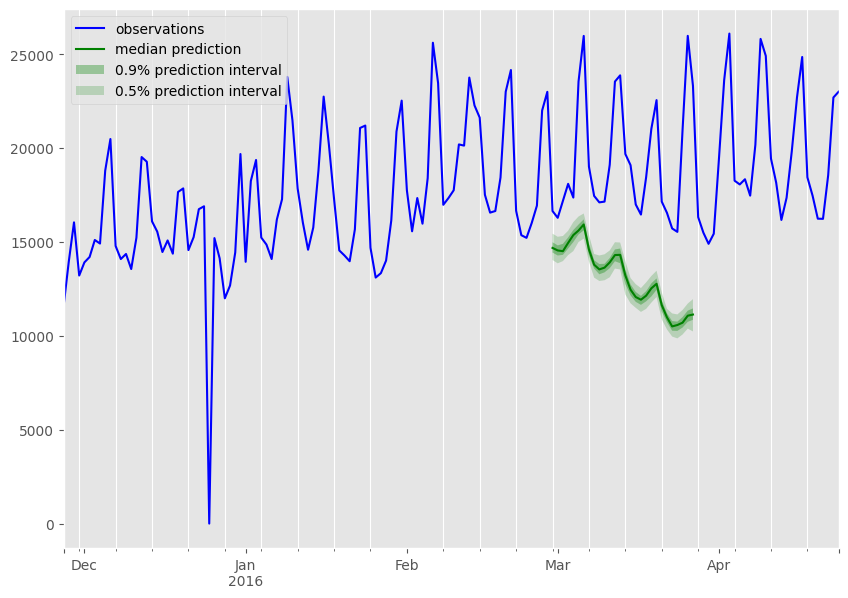

In [356]:
agg_prob_forecasts_deepar = functools.reduce(
    lambda a, b: sum_forecasts(a, b), forecasts_deepar_def)

# plot the aggregated sales against the aggregated forecast
plot_prob_forecasts(agg_actuals, agg_prob_forecasts_deepar)

## Plot top/bottom k individual time series

Using the metrics by time series, we can easily plot the worst and best time series for an error metric.

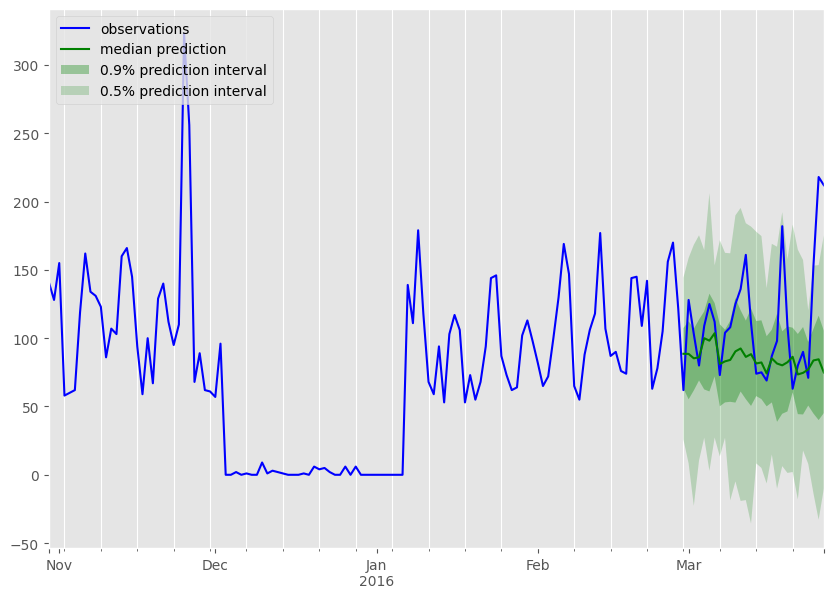

In [357]:
k = 3
# worst k (largest MSE)
metric = 'MSE'
item_metrics_deepar_def.nlargest(k, metric)
indices = item_metrics_deepar_def.nlargest(k, metric).index
idx = indices[0]  
plot_prob_forecasts(tss[idx], forecasts_deepar_def[idx])

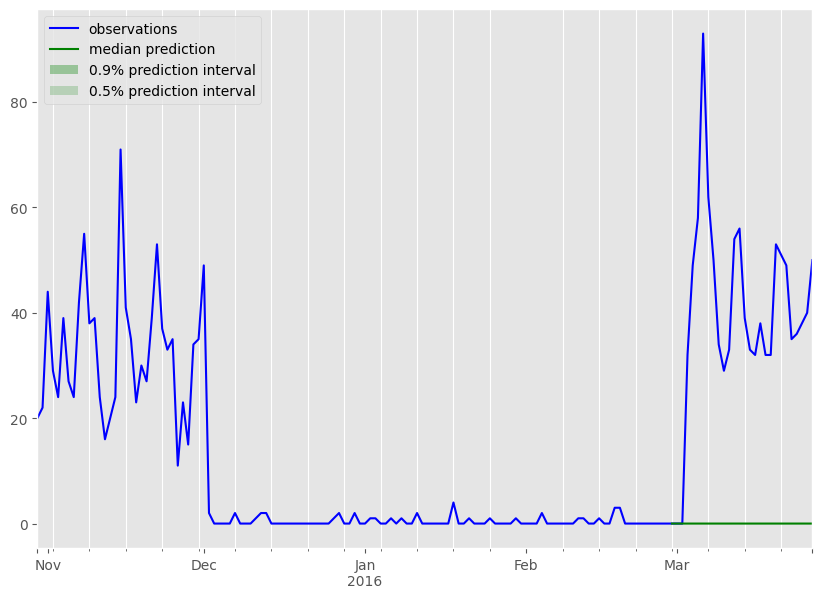

In [358]:
idx = indices[1]  
plot_prob_forecasts(tss[idx], forecasts_deepar_def[idx])

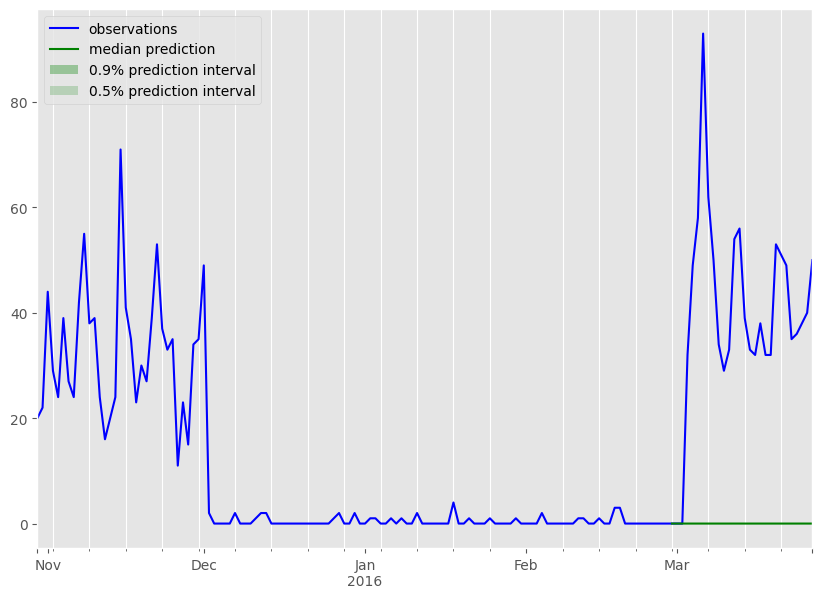

In [359]:
idx = indices[1]  
plot_prob_forecasts(tss[idx], forecasts_deepar_def[idx])

In [360]:
# best k (plot all non-trivial best forecasts)
indices = item_metrics_deepar_def.nsmallest(1000, metric).index
ct = 0
to_plot = []
for idx in indices:  
    if (forecasts_deepar_def[idx].mean.mean() > 0.2):
        to_plot.append([tss[idx], forecasts_deepar_def[idx]])
        ct += 1
    if ct == k:
        break

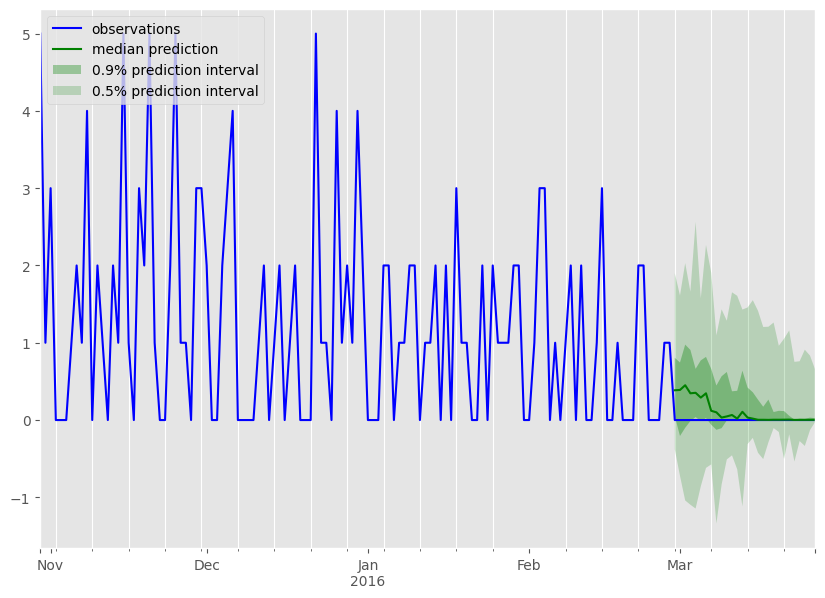

In [361]:
idx = 0
plot_prob_forecasts(to_plot[idx][0], to_plot[idx][1])

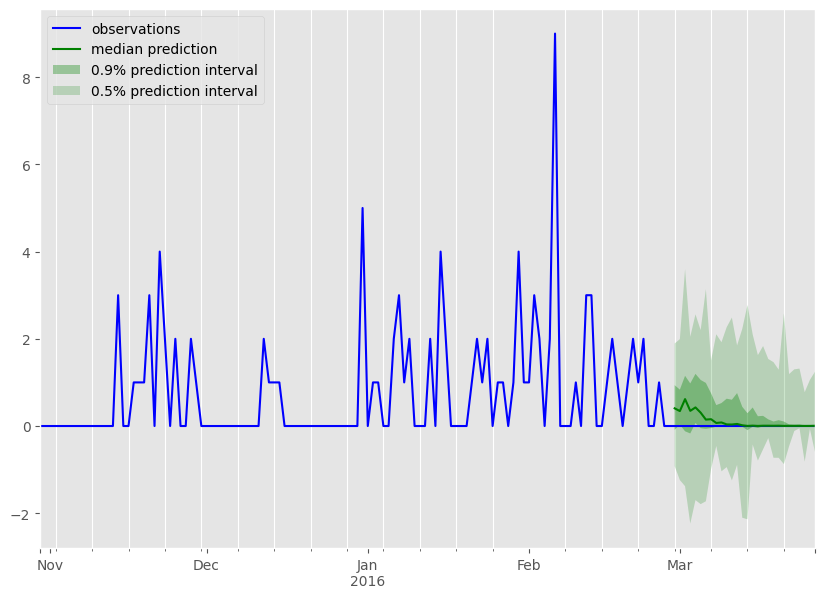

In [362]:
idx = 1
plot_prob_forecasts(to_plot[idx][0], to_plot[idx][1])

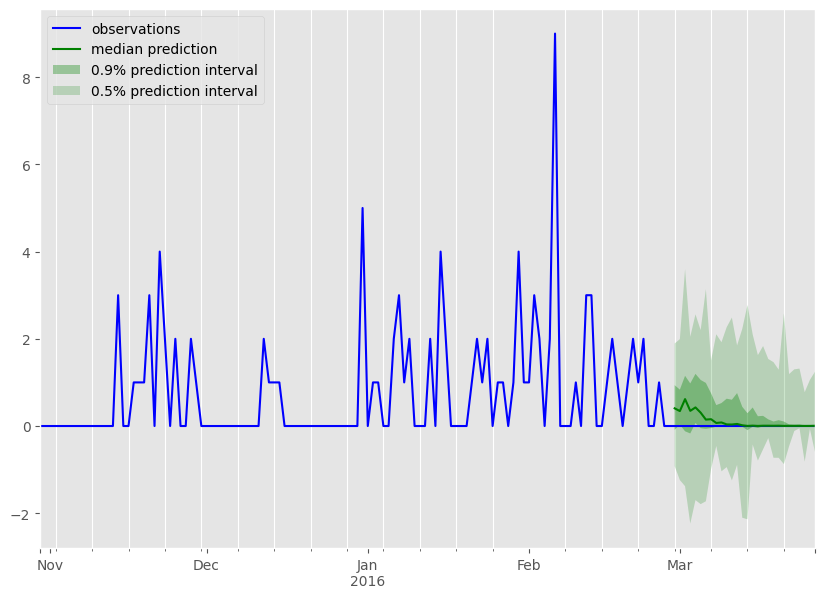

In [363]:
idx = 1
plot_prob_forecasts(to_plot[idx][0], to_plot[idx][1])

## Observations
* Forecasts can be negative
* Forecasts are real numbers, targets are counts

DeepAR by default uses a student-t distribution as output (more flexible than Gaussian, but still not adequate for count data).

Better choice: Negative Binomial Distribution.

In [413]:
from gluonts.torch.distributions.negative_binomial import NegativeBinomialOutput


estimator_deepar = DeepAREstimator(
    prediction_length=prediction_length,
    context_length=2*prediction_length,
    freq="1D",
    # adjust the output
    distr_output=NegativeBinomialOutput(),
    trainer_kwargs={
        "enable_progress_bar": True,
        "enable_model_summary": True,
        "max_epochs": 200
    },
    num_feat_dynamic_real=num_feat_dynamic_real, 
    num_feat_static_cat=len(static_cardinalities),
    cardinality = static_cardinalities,
)
predictor_deepar = estimator_deepar.train(list(training_dataset))

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
/usr/local/lib/python3.9/site-packages/pytorch_lightning/trainer/configuration_validator.py:118: UserWarning: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
  rank_zero_warn("You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.")

  | Name  | Type        | Params | In sizes | Out sizes   
----------------------------------------------------------------
0 | model | DeepARModel | 82.2 K | ?        | [1, 100, 28]
----------------------------------------------------------------
82.2 K    Trainable params
0         Non-trainable params
82.2 K    Total params
0.329     Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

Epoch 0, global step 49: train_loss reached 1.72876 (best 1.72876), saving model to "/Users/tim/Projects/maven/lightning_logs/version_122/checkpoints/epoch=0-step=49.ckpt" as top 1
Epoch 1, global step 99: train_loss was not in top 1
Epoch 2, global step 149: train_loss reached 1.59813 (best 1.59813), saving model to "/Users/tim/Projects/maven/lightning_logs/version_122/checkpoints/epoch=2-step=149.ckpt" as top 1
Epoch 3, global step 199: train_loss reached 1.48457 (best 1.48457), saving model to "/Users/tim/Projects/maven/lightning_logs/version_122/checkpoints/epoch=3-step=199.ckpt" as top 1
Epoch 4, global step 249: train_loss reached 1.40434 (best 1.40434), saving model to "/Users/tim/Projects/maven/lightning_logs/version_122/checkpoints/epoch=4-step=249.ckpt" as top 1
Epoch 5, global step 299: train_loss was not in top 1
Epoch 6, global step 349: train_loss reached 1.37525 (best 1.37525), saving model to "/Users/tim/Projects/maven/lightning_logs/version_122/checkpoints/epoch=6-step

Epoch 108, global step 5449: train_loss was not in top 1
Epoch 109, global step 5499: train_loss was not in top 1
Epoch 110, global step 5549: train_loss was not in top 1
Epoch 111, global step 5599: train_loss was not in top 1
Epoch 112, global step 5649: train_loss was not in top 1
Epoch 113, global step 5699: train_loss was not in top 1
Epoch 114, global step 5749: train_loss was not in top 1
Epoch 115, global step 5799: train_loss was not in top 1
Epoch 116, global step 5849: train_loss was not in top 1
Epoch 117, global step 5899: train_loss was not in top 1
Epoch 118, global step 5949: train_loss was not in top 1
Epoch 119, global step 5999: train_loss was not in top 1
Epoch 120, global step 6049: train_loss was not in top 1
Epoch 121, global step 6099: train_loss was not in top 1
Epoch 122, global step 6149: train_loss was not in top 1
Epoch 123, global step 6199: train_loss was not in top 1
Epoch 124, global step 6249: train_loss was not in top 1
Epoch 125, global step 6299: tr

In [414]:
forecast_it, ts_it = make_evaluation_predictions(
    dataset=test_data.input,
    predictor=predictor_deepar,
    num_samples=100
)

print("Obtaining time series conditioning values ...")
tss = list(tqdm(ts_it, total=len(test_data.input)))
print("Obtaining time series predictions ...")
forecasts_deepar = list(tqdm(forecast_it, total=len(test_data.input)))

Obtaining time series conditioning values ...


  0%|          | 0/8230 [00:00<?, ?it/s]

Obtaining time series predictions ...


  0%|          | 0/8230 [00:00<?, ?it/s]

In [415]:
evaluator = Evaluator(quantiles=[0.1, 0.5, 0.9])
# gives me metrics both across time series and for individual time series
agg_metrics_deepar, item_metrics_deepar = evaluator(
    tss, forecasts_deepar)
agg_metrics_deepar

Running evaluation: 8230it [00:01, 4510.11it/s]
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: invalid value encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) /

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divid

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: invalid value encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: invalid value encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: Runti

  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: invalid value encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: invalid value encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/py

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: invalid value encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/met

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluat

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: invalid value encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluati

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: inval

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: invalid value encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: Ru

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: Runtime

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluo

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: invalid value encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: invalid value encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluatio

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:1

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: invalid value encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/met

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: invalid value encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluati

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:1

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:1

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: invalid value encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: invalid value encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: Runtime

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:1

/usr/local/lib/python3.9/site-packages/pandas/core/dtypes/astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
/usr/local/lib/python3.9/site-packages/pandas/core/dtypes/astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)


{'MSE': 10.320288046931347,
 'abs_error': 321977.0,
 'abs_target_sum': 541800.0,
 'abs_target_mean': 2.3511543134872417,
 'seasonal_error': 1.5737572279586844,
 'MASE': inf,
 'MAPE': 0.6958259978061433,
 'sMAPE': 1.324485962510342,
 'MSIS': inf,
 'QuantileLoss[0.1]': 96059.2,
 'Coverage[0.1]': 0.4767618469015796,
 'QuantileLoss[0.5]': 321977.0,
 'Coverage[0.5]': 0.6666941503211248,
 'QuantileLoss[0.9]': 217804.4,
 'Coverage[0.9]': 0.9260935601458079,
 'RMSE': 3.2125205130755736,
 'NRMSE': 1.3663588538817557,
 'ND': 0.5942727943890734,
 'wQuantileLoss[0.1]': 0.17729641934293097,
 'wQuantileLoss[0.5]': 0.5942727943890734,
 'wQuantileLoss[0.9]': 0.4020014765596161,
 'mean_absolute_QuantileLoss': 211946.86666666667,
 'mean_wQuantileLoss': 0.3911902300972068,
 'MAE_Coverage': 0.42609356014580796,
 'OWA': nan}

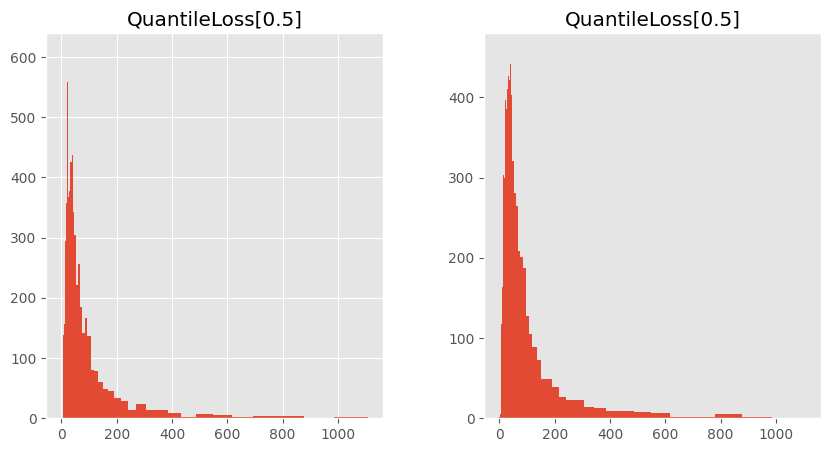

In [416]:
# obtain histogram of errors
metric='QuantileLoss[0.5]'
bins=np.append([0], np.logspace(np.log10(0.01),np.log10(item_metrics_deepar[metric].max()), 100))

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
item_metrics_deepar.hist(column=metric, bins=bins, ax=ax[0])
item_metrics_deepar_def.hist(column=metric, bins=bins, ax=ax[1])
plt.grid(which="both")
plt.show()


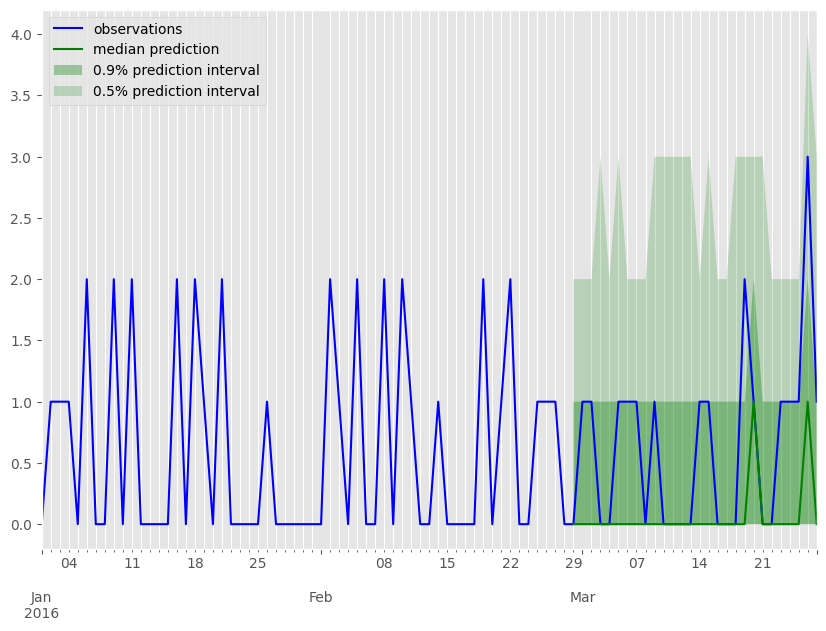

In [417]:
# check whether the forecasts look better, too
plot_prob_forecasts(tss[0], forecasts_deepar[0])

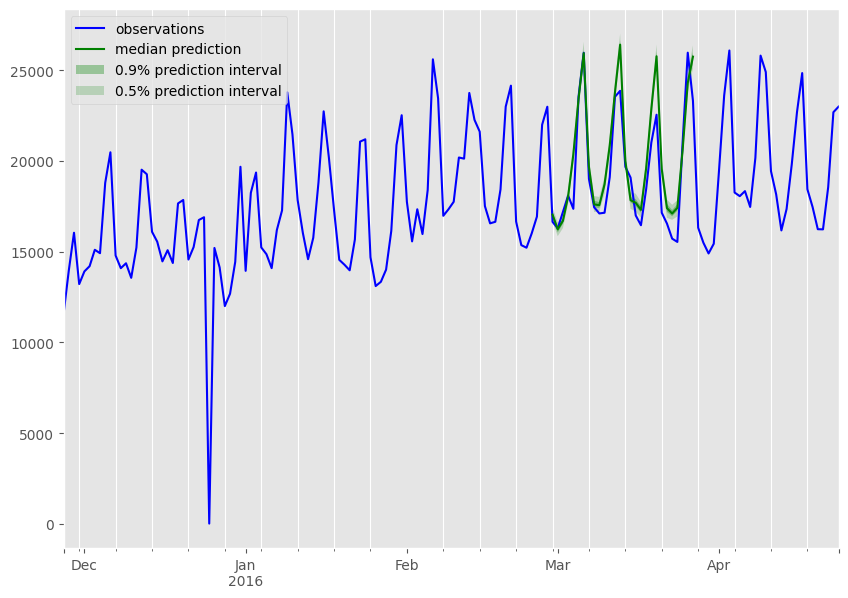

In [418]:
agg_prob_forecasts_deepar = functools.reduce(lambda a, b: sum_forecasts(a, b), forecasts_deepar)

# plot the aggregated sales against the aggregated forecast
plot_prob_forecasts(agg_actuals, agg_prob_forecasts_deepar)

# MQCNN, a seq2seq Model

* [MQCNN](https://arxiv.org/abs/1711.11053) is a sequence to sequence model
* it uses quantile regression to produce probabilistic forecasts

In [419]:
from gluonts.mx.model.seq2seq import MQCNNEstimator

from gluonts.mx.trainer import Trainer

quantiles=[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9] 

mqcnn_estimator = MQCNNEstimator(
    prediction_length=prediction_length,
    context_length=2*prediction_length,
    freq="1D",
    cardinality = static_cardinalities,
    use_feat_static_cat = True, 
    # we can use this option, if we only 
    # have features in the past (but need to mark them 
    # accordinaly "past_feat_dynamic_real")
#     use_past_feat_dynamic_real = True, 
    use_feat_dynamic_real = True, # this works
    trainer=Trainer(
        ctx="cpu",
        epochs=20,
        learning_rate=1e-3,
        num_batches_per_epoch=100),
        # decoder_mlp_dim_seq =[30],
        channels_seq=[30,30,30],
        dilation_seq=[1,3,5],
        kernel_size_seq=[7,3,3],
        quantiles=quantiles
)
mqcnn_predictor = mqcnn_estimator.train(training_dataset)

100%|████████| 100/100 [00:45<00:00,  2.21it/s, epoch=20/20, avg_epoch_loss=0.1]


In [420]:
forecast_it, ts_it = make_evaluation_predictions(
    dataset=test_data.input,  # test dataset
    predictor=mqcnn_predictor,  # predictor
    num_samples=100,  # number of sample paths we want for evaluation
)

print("Obtaining time series conditioning values ...")
tss = list(tqdm(ts_it, total=len(test_data.input)))
print("Obtaining time series predictions ...")
forecasts_mqcnn = list(tqdm(forecast_it, total=len(test_data.input)))

Obtaining time series conditioning values ...


  0%|          | 0/8230 [00:00<?, ?it/s]

Obtaining time series predictions ...


  0%|          | 0/8230 [00:00<?, ?it/s]

In [421]:
# MQCNN is a quantile regression based method, so we cannot 
# construct sample paths
# instead, we obtain quantiles from the forecast 
# probability distribution
def plot_quant_forecasts(ts_ent, forecast_ent, quantiles=quantiles):
    plot_length = 150
    legend = ["observations"] + [
        f"{k}% quantile interval" for k in quantiles
    ][::-1]

    fig, ax = plt.subplots(1, 1, figsize=(10, 7))
    ts_ent[-plot_length:].plot(ax=ax)  # plot the time series
    forecast_ent.plot(intervals=quantiles, color='purple')
    plt.grid(which="both")
    plt.legend(legend, loc="upper left")
    plt.show()


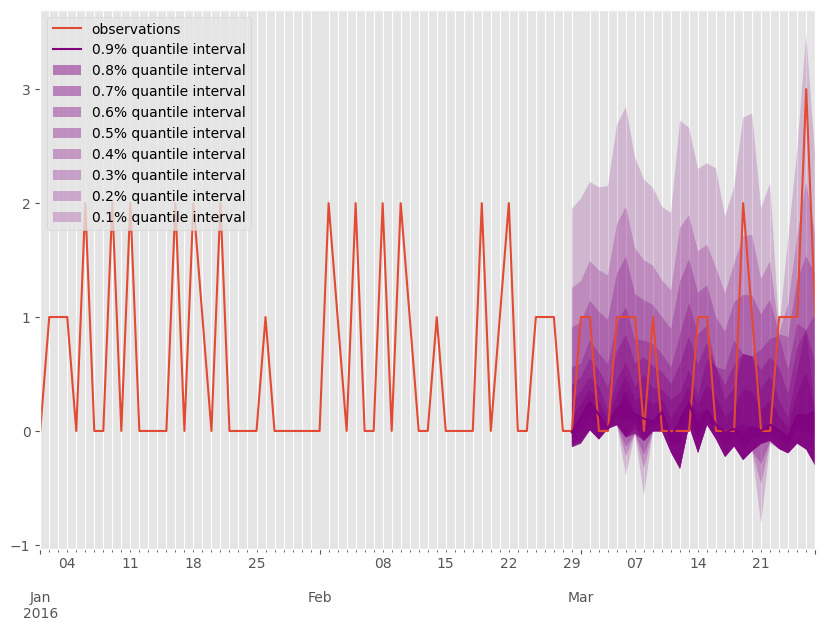

In [422]:
plot_quant_forecasts(tss[0], forecasts_mqcnn[0])

In [423]:
agg_metrics_mqcnn, item_metrics_mqcnn = evaluator(tss, forecasts_mqcnn)

Running evaluation: 8230it [00:01, 7745.00it/s]
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) 

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divid

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: 

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-pa

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evalua

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: 

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: 

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: Ru

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evalua

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evalua

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/met

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: Ru

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:1

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in double_scalars
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in double_scalars
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: Runt

/usr/local/lib/python3.9/site-packages/pandas/core/dtypes/astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)


# Compare Evaluations across Methods

In [424]:
df_evaluations = pd.DataFrame.from_records(
    [agg_metrics_mqcnn, agg_metrics_deepar_def, 
     agg_metrics_deepar, agg_metrics_npts
    ],
    index=["MQCNN", "DeepAR-student_t", "DeepAR", "NPTS"]
).transpose()

In [425]:
df_evaluations

,MQCNN,DeepAR-student_t,DeepAR,NPTS
MSE,1.038920e+01,11.805017,1.032029e+01,11.168627
abs_error,3.345521e+05,341167.825732,3.219770e+05,354003.000000
abs_target_sum,5.418000e+05,541800.000000,5.418000e+05,545454.000000
abs_target_mean,2.351154e+00,2.351154,2.351154e+00,2.367011
seasonal_error,1.573757e+00,1.388872,1.573757e+00,1.392902
MASE,inf,1.566062,inf,1.563434
MAPE,7.309389e-01,0.806658,6.958260e-01,0.735100
sMAPE,1.395240e+00,1.540306,1.324486e+00,1.381406
MSIS,inf,33.066225,inf,15.822756
QuantileLoss[0.1],1.186605e+05,115906.205533,9.605920e+04,115652.200000


## Let's look into missing value handling a little

In [426]:
# replace the 0s in sales with a missing value
sales_with_prices_v2 = sales_with_prices
sales_with_prices_v2['sales'][sales_with_prices_v2['for_sale']==0.0] = np.nan

/var/folders/wf/6gh5723s0lg0c41lqgm8y8xm0000gn/T/ipykernel_47970/727739680.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sales_with_prices_v2['sales'][sales_with_prices_v2['for_sale']==0.0] = np.nan


In [427]:
from gluonts.dataset.pandas import PandasDataset

dataset_v2 = PandasDataset.from_long_dataframe(
    sales_with_prices_v2,
    item_id='id',
    target='sales',
    feat_dynamic_real=list([
        'sell_price', 'for_sale',
        'event_type_1','event_type_2', 
        'snap_CA', 'snap_TX', 'snap_WI' 
    ]) + holidays,
    static_features=features,
)

In [428]:
from gluonts.dataset.split import split

training_dataset_v2, test_gen_v2 = split(dataset_v2, offset=-prediction_length)
test_data_v2 = test_gen_v2.generate_instances(prediction_length=prediction_length, windows=1)

In [429]:
estimator_deepar_v2 = DeepAREstimator(
    prediction_length=prediction_length,
    freq="1D",
    # adjust the output
    distr_output=NegativeBinomialOutput(),
    trainer_kwargs={
        "enable_progress_bar": True,
        "enable_model_summary": True,
        "max_epochs": 200
    },
    num_feat_dynamic_real=num_feat_dynamic_real, 
    num_feat_static_cat=len(static_cardinalities),
    cardinality = static_cardinalities,
)
predictor_deepar_v2 = estimator_deepar_v2.train(list(training_dataset_v2))

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
/usr/local/lib/python3.9/site-packages/pytorch_lightning/trainer/configuration_validator.py:118: UserWarning: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
  rank_zero_warn("You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.")

  | Name  | Type        | Params | In sizes | Out sizes   
----------------------------------------------------------------
0 | model | DeepARModel | 82.2 K | ?        | [1, 100, 28]
----------------------------------------------------------------
82.2 K    Trainable params
0         Non-trainable params
82.2 K    Total params
0.329     Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

Epoch 0, global step 49: train_loss reached 2.52218 (best 2.52218), saving model to "/Users/tim/Projects/maven/lightning_logs/version_123/checkpoints/epoch=0-step=49.ckpt" as top 1
Epoch 1, global step 99: train_loss was not in top 1
Epoch 2, global step 149: train_loss reached 2.01860 (best 2.01860), saving model to "/Users/tim/Projects/maven/lightning_logs/version_123/checkpoints/epoch=2-step=149.ckpt" as top 1
Epoch 3, global step 199: train_loss was not in top 1
Epoch 4, global step 249: train_loss reached 1.91389 (best 1.91389), saving model to "/Users/tim/Projects/maven/lightning_logs/version_123/checkpoints/epoch=4-step=249.ckpt" as top 1
Epoch 5, global step 299: train_loss was not in top 1
Epoch 6, global step 349: train_loss was not in top 1
Epoch 7, global step 399: train_loss was not in top 1
Epoch 8, global step 449: train_loss reached 1.70231 (best 1.70231), saving model to "/Users/tim/Projects/maven/lightning_logs/version_123/checkpoints/epoch=8-step=449.ckpt" as top 1
E

Epoch 105, global step 5299: train_loss was not in top 1
Epoch 106, global step 5349: train_loss was not in top 1
Epoch 107, global step 5399: train_loss was not in top 1
Epoch 108, global step 5449: train_loss was not in top 1
Epoch 109, global step 5499: train_loss was not in top 1
Epoch 110, global step 5549: train_loss was not in top 1
Epoch 111, global step 5599: train_loss was not in top 1
Epoch 112, global step 5649: train_loss was not in top 1
Epoch 113, global step 5699: train_loss was not in top 1
Epoch 114, global step 5749: train_loss was not in top 1
Epoch 115, global step 5799: train_loss was not in top 1
Epoch 116, global step 5849: train_loss was not in top 1
Epoch 117, global step 5899: train_loss was not in top 1
Epoch 118, global step 5949: train_loss was not in top 1
Epoch 119, global step 5999: train_loss was not in top 1
Epoch 120, global step 6049: train_loss was not in top 1
Epoch 121, global step 6099: train_loss was not in top 1
Epoch 122, global step 6149: tr

In [430]:
forecast_it, ts_it = make_evaluation_predictions(
    dataset=test_data_v2.input,
    predictor=predictor_deepar_v2,
    num_samples=100
)

print("Obtaining time series conditioning values ...")
tss = list(tqdm(ts_it, total=len(test_data_v2.input)))
print("Obtaining time series predictions ...")
forecasts_deepar_v2 = list(tqdm(forecast_it, total=len(test_data_v2.input)))

Obtaining time series conditioning values ...


  0%|          | 0/8230 [00:00<?, ?it/s]

Obtaining time series predictions ...


  0%|          | 0/8230 [00:00<?, ?it/s]

In [431]:
# find article-store-combinations with lots of missing values 
# and fast moving for better illustration
missing_ids = sales_with_prices_v2[
    (sales_with_prices_v2['for_sale'] == 0)
    ]['id'].unique()
missing_ids

array(['FOODS_3_296_CA_1_validation', 'FOODS_3_296_CA_2_validation',
       'FOODS_3_296_CA_4_validation', 'FOODS_3_296_TX_2_validation',
       'FOODS_3_296_WI_2_validation', 'FOODS_3_595_CA_1_validation',
       'FOODS_3_595_CA_3_validation'], dtype=object)

In [435]:
tmp_df['sales'] = sales_with_prices_v2[ 
    sales_with_prices_v2['id'].isin(missing_ids)][['id', 'sales']].groupby('id')['sales'].sum()

fast_missing_ids = tmp_df['sales'][ tmp_df['sales'] > 100].index
fast_missing_ids

Index(['FOODS_3_296_CA_2_validation', 'FOODS_3_296_TX_2_validation',
       'FOODS_3_296_WI_2_validation'],
      dtype='object', name='id')

In [441]:
missing_indices = [idx for idx, s in enumerate(training_dataset_v2_list) if s['item_id'] in fast_missing_ids]
missing_index = missing_indices[1]

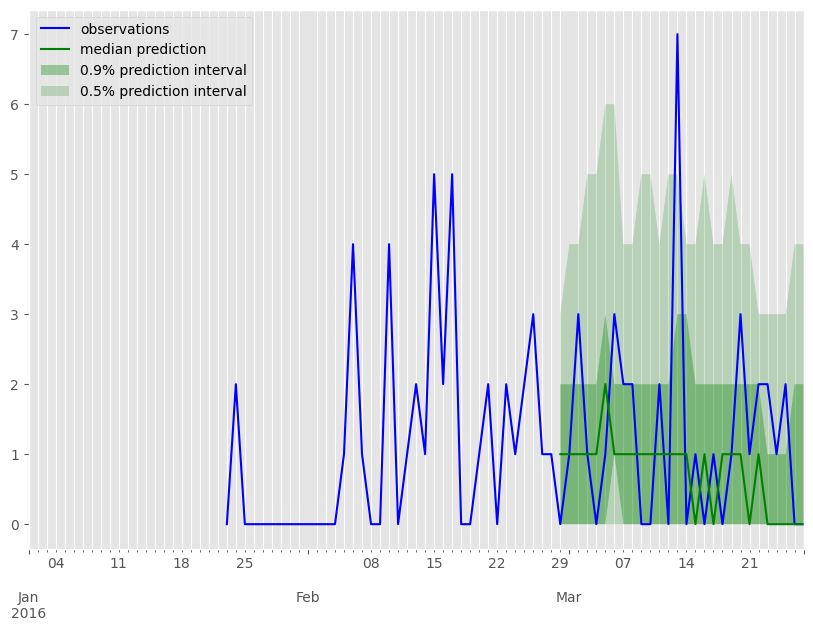

In [466]:
# let's look at a few time series with missing value handling and without missing values
# check whether the forecasts look better, too
plot_prob_forecasts(tss[missing_index], forecasts_deepar_v2[missing_index])


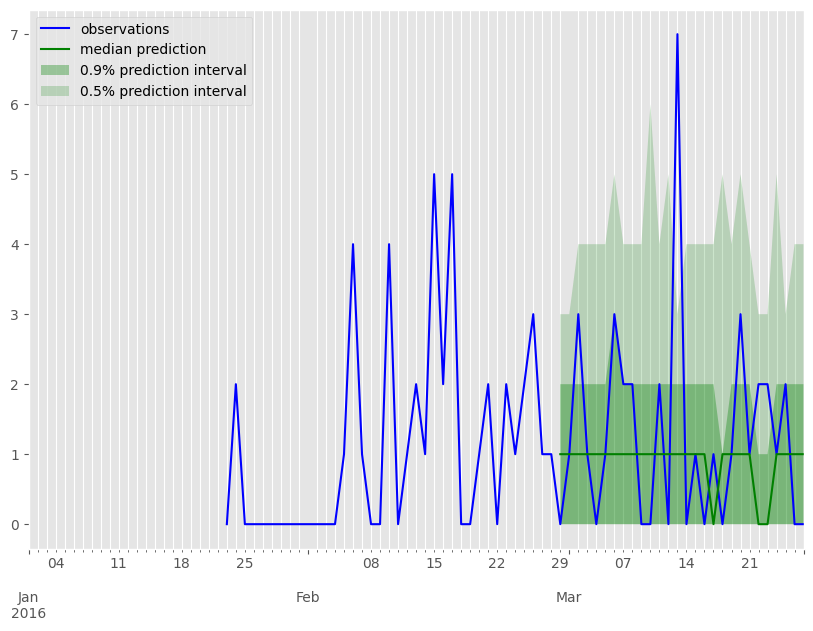

In [467]:
plot_prob_forecasts(tss[missing_index], forecasts_deepar[missing_index])

looks better, but then more work needs to be done. Some parameters to play with:
   * oversample "fast" items -- you can do that in pandas by just copying items with lots of sales as a simple hack
   * play with a few of the hyperparameters to understand their influence, e.g., context_length

# Homework
* Try to load your dataset and run it through this notebook. If it's in a pandas data frame format, it should be straight-forward, see [here](https://ts.gluon.ai/stable/tutorials/data_manipulation/pandasdataframes.html) for more examples. Alternatively, try one of the [publicly available datasets](https://ts.gluon.ai/stable/tutorials/forecasting/extended_tutorial.html#Available-datasets-in-GluonTS)
* Try to change the price feature. Instead of using the absolute price, use relative price, price difference, log-scaled or z-scaled price. Easiest to do this in pandas
* Try to play with the scaling of the input data. For example, try a log-scaling and see what happens.
* Try another model. For example, TFT or WaveNet. See more [here](https://ts.gluon.ai/stable/getting_started/models.html)
* Feeling adventuours? Try the hierarchical forecasting model [here](https://ts.gluon.ai/stable/tutorials/forecasting/hierarchical_model_tutorial.html)

For TFT: 

```python
from gluonts.torch.model.tft import TemporalFusionTransformerEstimator
from pytorch_lightning.loggers import TensorBoardLogger

estimator_tft = TemporalFusionTransformerEstimator(
    freq="1D",
    prediction_length=7,
    context_length=180,
    quantiles=[0.1, 0.5, 0.9],
    static_cardinalities=static_cardinalities,
    dynamic_dims=[num_feat_dynamic_real],
    batch_size=32,
    trainer_kwargs={
        "max_epochs": 20,
        "logger": TensorBoardLogger("tb_logs"),
    }
)

predictor_tft = estimator_tft.train(training_dataset)
```

For loading other datasets in GluonTS
```python
from gluonts.dataset.repository import get_dataset, dataset_names
solar = get_dataset("solar-energy")
```
and Hugging Face
```python
from gluonts.dataset.common import ListDataset
from datasets import load_dataset

traffic = load_dataset("monash_tsf", "traffic_hourly")
dataset_training = ListDataset(traffic["train"], freq="H")
dataset_testing = ListDataset(traffic["test"], freq="H")
```

# Hyper-parameter tuning

For best accuracy, deep learning models often require tuning of their hyper-parameters. These can include architectural details (number of layers, size of layers, activations being used, normalization), or training options (dropout rate, optimization algorithm to use, early stopping).

There are several packages offering hyper-parameter tuning functionality, that GluonTS can easily work with. Let's look at an example using Optuna.

In [337]:
import optuna
from gluonts.torch.model.deepar import DeepAREstimator
from gluonts.evaluation import Evaluator

The way this works is simple: we need to define an "objective" to be optimized. This objective maps a given configuration of hyper-parameters into an objective value (usually some accuracy metric on a validation set).

The following class does exactly this. In the `__call__` method:
1. the hyper-parameters values to evaluate are retrieved
2. a DeepAREstimator is constructed with such hyper-parameters values
3. the estimator is trained on a training subset of the data
4. the resulting model is evaluated on a validation subset of the data, and some metric of choice is returned

In [338]:
class DeepARTuningObjective:
    def __init__(self, dataset, prediction_length: int, freq: str):
        self.dataset = dataset
        self.prediction_length = prediction_length
        self.freq = freq

        entry_split = [self.split_entry(entry) for entry in self.dataset]
        self.entry_pasts = [entry[0] for entry in entry_split]
        self.entry_futures = [entry[1] for entry in entry_split]
    
    def __call__(self, trial):
        params = self.get_params(trial)
        
        estimator = DeepAREstimator(
            num_layers=params['num_layers'],
            hidden_size=params['hidden_size'],
            prediction_length=self.prediction_length,
            freq=self.freq,
            trainer_kwargs={
                "enable_progress_bar": False,
                "enable_model_summary": False,
                "max_epochs": 10,
            }
        )

        predictor = estimator.train(self.entry_pasts, cache_data=True)
        forecast_it = predictor.predict(self.entry_pasts)

        forecasts = list(forecast_it)

        evaluator = Evaluator(quantiles=[0.1, 0.5, 0.9])
        agg_metrics, item_metrics = evaluator(self.entry_futures, forecasts, num_series=len(self.dataset))
        return agg_metrics["mean_wQuantileLoss"]
    
    def get_params(self, trial: optuna.trial.Trial) -> dict:
        return {
            "num_layers": trial.suggest_int("num_layers", 1, 5),
            "hidden_size": trial.suggest_int("hidden_size", 10, 50),
        }

    def split_entry(self, entry):
        entry_past = {}
        for key, value in entry.items():
            if key == "target":
                entry_past[key] = value[: -self.prediction_length]
            else:
                entry_past[key] = value

        df = pd.DataFrame(
            entry['target'],
            index=pd.period_range(
                start=entry['start'],
                periods=len(entry['target']),
                freq=self.freq
            )
        )

        return entry_past, df[-self.prediction_length:]

Optuna will take care of picking the next hyper-parameter settings to try, based on past values of the validation metric.

This will result in a sequence of training procedures being run, one for each hyper-parameter setting.

In [339]:
objective = DeepARTuningObjective(training_dataset, freq="1D", prediction_length=6 * 12)
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=5)

[I 2024-03-08 23:56:27,783] A new study created in memory with name: no-name-df32923a-0d72-4e51-a509-2c46446aef9f
/usr/local/lib/python3.9/site-packages/torch/nn/modules/rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
/usr/local/lib/python3.9/site-packages/pytorch_lightning/trainer/configuration_validator.py:118: UserWarning: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
  rank_zero_warn("You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.")
Epoch 0, global step 49: train_loss reached -4.91766 (best -4.91766), saving model to "/Users/tim/Projects/maven/lightning_logs/version_111/checkpoints/epoch=0-step=49.ckpt" as top 

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_err

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encou

  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/ev

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarn

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encou

  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluont

  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarn

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarn

  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: 

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encou

  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: 

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encou

  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: 

  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9

  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/ev

  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divi

  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: 

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return

  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: 

  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:1

  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/ev

  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: 

  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:1

  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/ev

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encou

  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by z

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: Runtime

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/pandas/core/dtypes/astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
/usr/local/lib/python3.9/site-packages/pandas/core/dtypes/astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
/usr/local/lib/python3.9/site-packages/pandas/core/dtypes/astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
/usr/local/lib/python3.9/site-packages/pandas/core/dtypes/astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
[I 2024-03-08 23:58:45,069] Trial 0 finished with value: 0.6954354217569994 and parameters: {'num_layers': 1, 'hidden_size': 21}. Best is trial 0 with value: 0.6954354217569994.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
/usr/local/lib/python3.9/site-packa

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - 

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero e

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encou

  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/ev

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  re

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return

  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/ev

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_err

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarn

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return

  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: 

  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: 

  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: 

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - 

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarn

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero e

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarn

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarn

  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: 

  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: 

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_err

  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by

  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: 

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - 

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encou

  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: 

  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: 

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encou

  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/ev

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarn

  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/pandas/core/dtypes/astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
/usr/local/lib/python3.9/site-packages/pandas/core/dtypes/astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
/usr/local/lib/python3.9/site-packages/pandas/core/dtypes/astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
/usr/local/lib/python3.9/site-packages/pandas/core/dtypes/astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
[I 2024-03-09 00:02:56,524] Trial 1 finished with value: 0.7671400713744031 and parameters: {'num_layers': 4, 'hidden_size': 18}. Best is trial 0 with value: 0.6954354217569994.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
/usr/local/lib/python3.9/site-packa

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - 

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encou

  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: 

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encou

  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - 

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return

  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:1

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encou

  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: 

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encou

  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/ev

  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/ev

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_err

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return

  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/ev

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero e

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarn

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_err

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - 

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encou

Epoch 3, global step 199: train_loss reached -6.21729 (best -6.21729), saving model to "/Users/tim/Projects/maven/lightning_logs/version_114/checkpoints/epoch=3-step=199.ckpt" as top 1
Epoch 4, global step 249: train_loss reached -6.36150 (best -6.36150), saving model to "/Users/tim/Projects/maven/lightning_logs/version_114/checkpoints/epoch=4-step=249.ckpt" as top 1
Epoch 5, global step 299: train_loss was not in top 1
Epoch 6, global step 349: train_loss was not in top 1
Epoch 7, global step 399: train_loss was not in top 1
Epoch 8, global step 449: train_loss reached -6.42512 (best -6.42512), saving model to "/Users/tim/Projects/maven/lightning_logs/version_114/checkpoints/epoch=8-step=449.ckpt" as top 1
Epoch 9, global step 499: train_loss was not in top 1
Running evaluation: 100%|█████████████████| 8230/8230 [00:01<00:00, 7888.26it/s]
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.a

  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero e

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarn

  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: R

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - 

  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: 

  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: 

  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by

  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - 

  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by 

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarn

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return

  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: 

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarn

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarn

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/pandas/core/dtypes/astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
/usr/local/lib/python3.9/site-packages/pandas/core/dtypes/astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
/usr/local/lib/python3.9/site-packages/pandas/core/dtypes/astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
/usr/local/lib/python3.9/site-packages/pandas/core/dtypes/astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
[I 2024-03-09 00:12:24,321] Trial 3 finished with value: 0.6618610498636889 and parameters: {'num_layers': 1, 'hidden_size': 24}. Best is trial 2 with value: 0.5665769553791312.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
/usr/local/lib/python3.9/site-packa

  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: 

  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/ev

  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/ev

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - 

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero e

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarn

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_err

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/me

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return

  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/_base.py:422: RuntimeWarning: divide by zero encountered in float_scalars
  metrics["ND"] = cast(float, metrics["abs_error"]) / cast(
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts

  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: 

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - 

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - 

/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:154: RuntimeWarning: divide by zero encountered in divide
  return numerator / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs(target - forecast)) / seasonal_error
/usr/local/lib/python3.9/site-packages/gluonts/evaluation/metrics.py:105: RuntimeWarning: divide by zero encou

/usr/local/lib/python3.9/site-packages/pandas/core/dtypes/astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
/usr/local/lib/python3.9/site-packages/pandas/core/dtypes/astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
/usr/local/lib/python3.9/site-packages/pandas/core/dtypes/astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
/usr/local/lib/python3.9/site-packages/pandas/core/dtypes/astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
[I 2024-03-09 00:16:05,128] Trial 4 finished with value: 0.6280059747396504 and parameters: {'num_layers': 3, 'hidden_size': 31}. Best is trial 2 with value: 0.5665769553791312.
